## Install dependencjes

**Note:** Let's install the `inference-gpu` library, which will be used to efficiently run our object detection and keypoint detection models on GPUs. `inference-gpu` utilizes the `onnxruntime-gpu` library internally for optimal performance. We'll install a specific version of `onnxruntime-gpu` to guarantee compatibility with the CUDA 12 environment in Google Colab.

In [ ]:
!pip install mediapipe supervision opencv-python
!pip install -q gdown inference-gpu ultralytics
!pip install -q onnxruntime-gpu==1.18.0 --index-url https://aiinfra.pkgs.visualstudio.com/PublicPackages/_packaging/onnxruntime-cuda-12/pypi/simple/

ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
mediapipe 0.10.21 requires numpy<2, but you have numpy 2.1.1 which is incompatible.
google-colab 1.0.0 requires pandas==2.2.2, but you have pandas 2.2.3 which is incompatible.
tensorflow 2.18.0 requires numpy<2.1.0,>=1.26.0, but you have numpy 2.1.1 which is incompatible.
numba 0.60.0 requires numpy<2.1,>=1.22, but you have numpy 2.1.1 which is incompatible.
pymc 5.21.1 requires rich>=13.7.1, but you have rich 13.0.1 which is incompatible.


In [ ]:
!pip uninstall -y supervision && pip install -q supervision>=0.23.0

Found existing installation: supervision 0.25.1
Uninstalling supervision-0.25.1:
  Successfully uninstalled supervision-0.25.1


In [ ]:
!pip install "numpy<2" --upgrade

  Using cached numpy-1.26.4-cp311-cp311-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (61 kB)
Using cached numpy-1.26.4-cp311-cp311-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (18.3 MB)
  Attempting uninstall: numpy
    Found existing installation: numpy 2.0.2
    Uninstalling numpy-2.0.2:
      Successfully uninstalled numpy-2.0.2
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
inference-gpu 0.46.0 requires numpy<2.3.0,>=2.0.0, but you have numpy 1.26.4 which is incompatible.
google-colab 1.0.0 requires pandas==2.2.2, but you have pandas 2.2.3 which is incompatible.
pymc 5.21.1 requires rich>=13.7.1, but you have rich 13.0.1 which is incompatible.


In [ ]:
!gdown -O "Q4_side_60-90.mp4" "https://drive.google.com/uc?id=1ekANrkzwz4pJJaSZD9bu84vLuFNbxtHQ"
# !gdown -O "Q4_side_540-570.mp4" "https://drive.google.com/uc?id=1KpRt7b4YqD-qV4tZbRSjjIKExyu8S7WF"
# !gdown -O "Q4_side_570-600.mp4" "https://drive.google.com/uc?id=17oxCSkNgY9pDvReAFXan1q_7g3ZOsLWV"
# !gdown -O "Q4_side_480-510.mp4" "https://drive.google.com/uc?id=1CryBEviJOvHyNnIc0j7G2XdHOBXNLvqc"
# !gdown -O "Q4_side_600-end.mp4" "https://drive.google.com/uc?id=1CryBEviJOvHyNnIc0j7G2XdHOBXNLvqc"

Downloading...
From: https://drive.google.com/uc?id=1ekANrkzwz4pJJaSZD9bu84vLuFNbxtHQ
To: /content/Q4_side_60-90.mp4
100% 47.6M/47.6M [00:01<00:00, 43.3MB/s]


In [ ]:
!gdown -O "sample.mp4" "https://drive.google.com/uc?id=1V8oe0k4-fCdoWli6yJMV1BshOzfmpy-x"

Downloading...
From: https://drive.google.com/uc?id=1V8oe0k4-fCdoWli6yJMV1BshOzfmpy-x
To: /content/sample.mp4
100% 28.1M/28.1M [00:00<00:00, 149MB/s]


In [ ]:
import os
os.environ["ONNXRUNTIME_EXECUTION_PROVIDERS"] = "[CUDAExecutionProvider]"

## player detection and tracking

In [ ]:
from inference import get_model
from google.colab import userdata

ROBOFLOW_API_KEY = userdata.get('ROBOFLOW_API')
PLAYER_DETECTION_MODEL_ID = "basketball-players-2-qwvnh/3"
PLAYER_DETECTION_MODEL = get_model(model_id=PLAYER_DETECTION_MODEL_ID, api_key=ROBOFLOW_API_KEY)

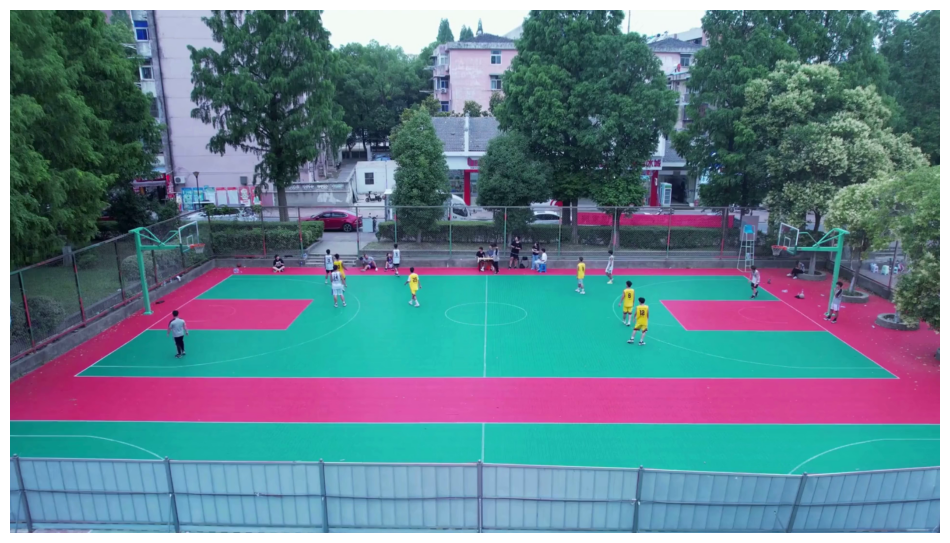

In [ ]:
import supervision as sv

SOURCE_VIDEO_PATH = "/content/sample.mp4"

frame_generator = sv.get_video_frames_generator(SOURCE_VIDEO_PATH)
frame = next(frame_generator)

sv.plot_image(frame)

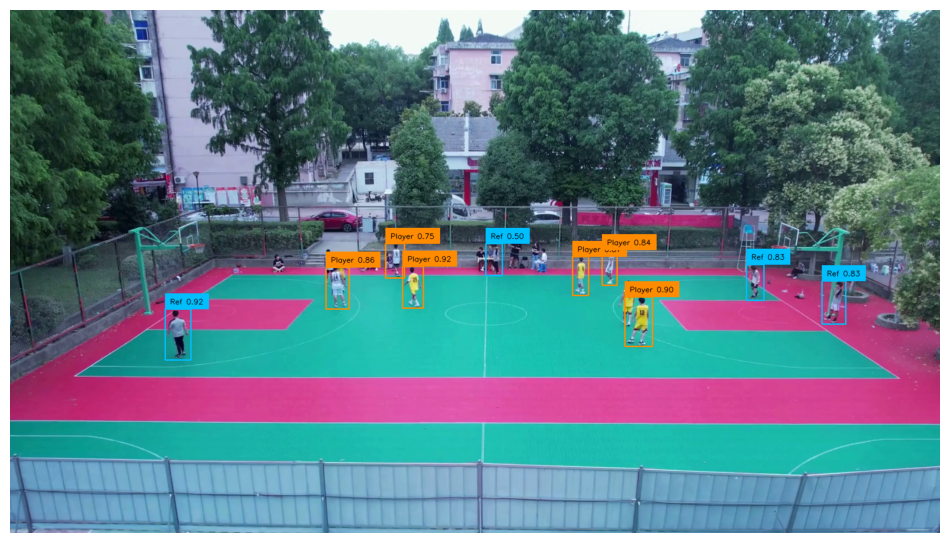

In [ ]:
import supervision as sv

SOURCE_VIDEO_PATH = "/content/sample.mp4"

box_annotator = sv.BoxAnnotator(
    color=sv.ColorPalette.from_hex(['#FF8C00', '#00BFFF', '#FF1493', '#FFD700']),
    thickness=2
)
label_annotator = sv.LabelAnnotator(
    color=sv.ColorPalette.from_hex(['#FF8C00', '#00BFFF', '#FF1493', '#FFD700']),
    text_color=sv.Color.from_hex('#000000')
)

frame_generator = sv.get_video_frames_generator(SOURCE_VIDEO_PATH)
frame = next(frame_generator)

# Run inference
result = PLAYER_DETECTION_MODEL.infer(frame, confidence=0.3)[0]
detections = sv.Detections.from_inference(result)

# **Filter out small detections (likely to be trash)**
# MIN_AREA = 8000  # Adjust this threshold based on your dataset
# detections = detections[detections.area > MIN_AREA]

# Generate labels after filtering
labels = [
    f"{class_name} {confidence:.2f}"
    for class_name, confidence
    in zip(detections['class_name'], detections.confidence)
]

# Annotate the frame
annotated_frame = frame.copy()
annotated_frame = box_annotator.annotate(scene=annotated_frame, detections=detections)
annotated_frame = label_annotator.annotate(scene=annotated_frame, detections=detections, labels=labels)

# Display the result
sv.plot_image(annotated_frame)


## video game style visualization

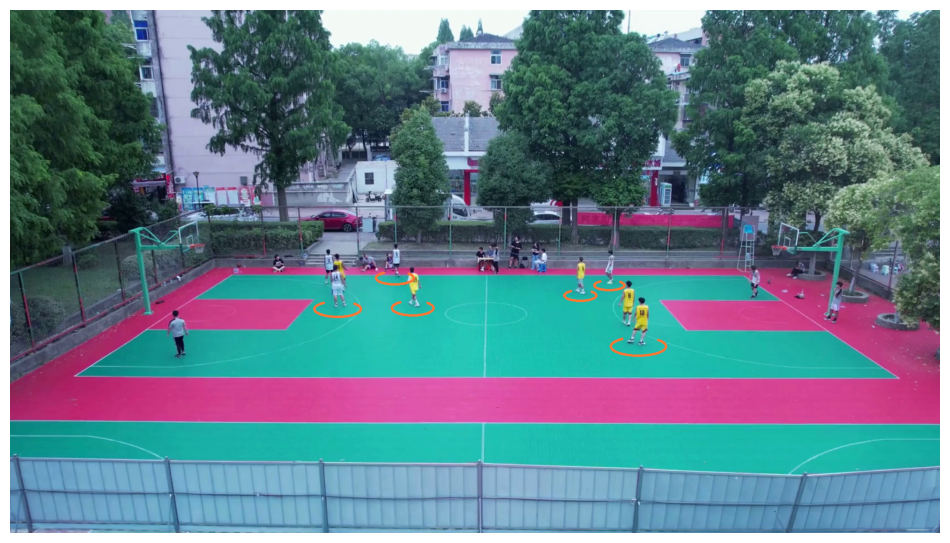

In [ ]:
import supervision as sv
import numpy as np  # Ensure we handle arrays properly

SOURCE_VIDEO_PATH = "/content/sample.mp4"
PLAYER_ID = 4
MAX_PLAYERS = 10

ellipse_annotator = sv.EllipseAnnotator(thickness=3)

frame_generator = sv.get_video_frames_generator(SOURCE_VIDEO_PATH)
frame = next(frame_generator)

result = PLAYER_DETECTION_MODEL.infer(frame, confidence=0.3)[0]
detections = sv.Detections.from_inference(result)

# Filter for the specific PLAYER_ID
all_detections = detections[detections.class_id == PLAYER_ID]
all_detections = all_detections.with_nms(threshold=0.3, class_agnostic=True)
all_detections.class_id -= 1

# Check if there are detections before sorting
if len(all_detections.confidence) > 0:
    # Sort detections by confidence (highest first) and keep only the top 10
    sorted_indices = sorted(
        range(len(all_detections.confidence)),
        key=lambda i: all_detections.confidence[i],
        reverse=True
    )[:MAX_PLAYERS]

    # Convert filtered data back to Detections format
    all_detections = sv.Detections(
        xyxy=np.array([all_detections.xyxy[i] for i in sorted_indices]),  # Ensure 2D array
        confidence=np.array([all_detections.confidence[i] for i in sorted_indices]),
        class_id=np.array([all_detections.class_id[i] for i in sorted_indices])
    )
else:
    # Create an empty Detections object if no valid detections exist
    all_detections = sv.Detections(
        xyxy=np.empty((0, 4)),
        confidence=np.empty((0,)),
        class_id=np.empty((0,))
    )

# Annotate frame
annotated_frame = frame.copy()
annotated_frame = ellipse_annotator.annotate(scene=annotated_frame, detections=all_detections)

sv.plot_image(annotated_frame)


## player tracking

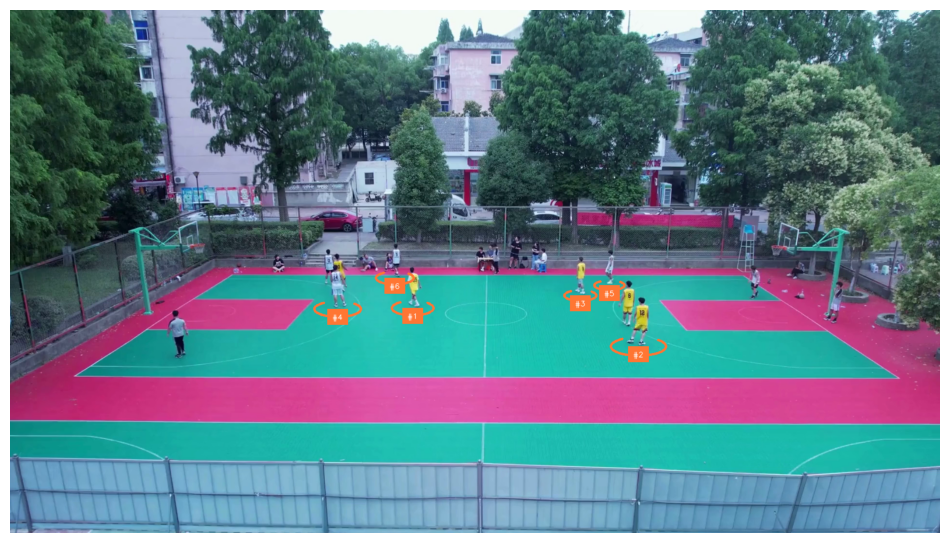

In [ ]:
import supervision as sv
import numpy as np

SOURCE_VIDEO_PATH = "/content/sample.mp4"
PLAYER_ID = 4
MAX_PLAYERS = 10
TRACKING_BUFFER = 30  # Frames before removing lost players

ellipse_annotator = sv.EllipseAnnotator(thickness=3)
label_annotator = sv.LabelAnnotator(text_position=sv.Position.BOTTOM_CENTER)

tracker = sv.ByteTrack()
tracker.reset()

# Dictionary to store lost players with frame timeout
lost_players = {}

# Set to keep track of previously tracked players
previous_tracker_ids = set()

frame_generator = sv.get_video_frames_generator(SOURCE_VIDEO_PATH)
frame = next(frame_generator)

result = PLAYER_DETECTION_MODEL.infer(frame, confidence=0.3)[0]
detections = sv.Detections.from_inference(result)

# Filter only basketball players
all_detections = detections[detections.class_id == PLAYER_ID]
all_detections = all_detections.with_nms(threshold=0.3, class_agnostic=True)
all_detections.class_id -= 1

# Ensure detections are valid before sorting
if len(all_detections.confidence) > 0:
    # Sort detections by confidence and keep only MAX_PLAYERS
    sorted_indices = sorted(
        range(len(all_detections.confidence)),
        key=lambda i: all_detections.confidence[i],
        reverse=True
    )[:MAX_PLAYERS]

    all_detections = sv.Detections(
        xyxy=np.array([all_detections.xyxy[i] for i in sorted_indices]),
        confidence=np.array([all_detections.confidence[i] for i in sorted_indices]),
        class_id=np.array([all_detections.class_id[i] for i in sorted_indices])
    )

# Update tracker
tracked_detections = tracker.update_with_detections(detections=all_detections)

# Get currently active tracker IDs
active_tracker_ids = set(tracked_detections.tracker_id)

# Identify lost players
lost_now = previous_tracker_ids - active_tracker_ids

# Maintain lost players with a timeout
for lost_id in list(lost_players.keys()):
    lost_players[lost_id] -= 1  # Decrease timeout counter
    if lost_players[lost_id] <= 0:
        del lost_players[lost_id]  # Remove expired lost player

# Store new lost players
for lost_id in lost_now:
    if lost_id not in lost_players:
        lost_players[lost_id] = TRACKING_BUFFER  # Add lost player with timeout

# Remove recovered players from lost list
for tracker_id in active_tracker_ids:
    lost_players.pop(tracker_id, None)

# Update previously tracked players
previous_tracker_ids = active_tracker_ids.copy()

# Annotate frame
labels = [f"#{tracker_id}" for tracker_id in tracked_detections.tracker_id]

annotated_frame = frame.copy()
annotated_frame = ellipse_annotator.annotate(scene=annotated_frame, detections=tracked_detections)
annotated_frame = label_annotator.annotate(scene=annotated_frame, detections=tracked_detections, labels=labels)

sv.plot_image(annotated_frame)


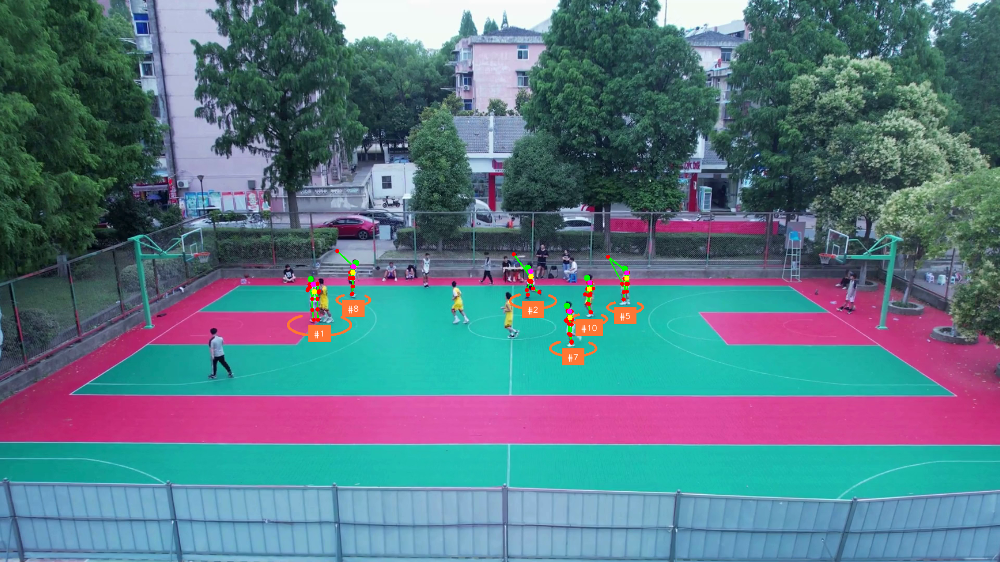

In [ ]:
from ultralytics import YOLO
from tqdm import tqdm
import supervision as sv
import cv2
import numpy as np
from google.colab.patches import cv2_imshow
from IPython.display import clear_output

# Initialize models
pose_model = YOLO('yolov8n-pose.pt')
PLAYER_ID = 4
SOURCE_VIDEO_PATH = "/content/sample.mp4"
STRIDE = 30
MAX_PLAYERS = 10
TRACKING_BUFFER = 30

# Initialize annotators and tracker
ellipse_annotator = sv.EllipseAnnotator(thickness=3)
label_annotator = sv.LabelAnnotator(text_position=sv.Position.BOTTOM_CENTER)

# Keypoint configuration
KEYPOINT_NAMES = [
    "head", "left_shoulder", "right_shoulder",
    "left_elbow", "right_elbow", "left_wrist", "right_wrist",
    "left_hip", "right_hip", "left_knee", "right_knee",
    "left_ankle", "right_ankle", "neck", "spine_mid"
]

SKELETON = [
    [11, 9], [9, 7], [12, 10], [10, 8],
    [7, 8], [1, 7], [2, 8],
    [1, 2], [1, 3], [2, 4],
    [3, 5], [4, 6],
    [0, 13], [13, 1], [13, 2],
    [13, 14], [14, 7], [14, 8]
]

def merge_facial_keypoints(original_keypoints):
    facial_indices = [0, 1, 2, 3, 4]
    valid_points = [original_keypoints[i] for i in facial_indices
                   if i < len(original_keypoints) and all(original_keypoints[i] > 0)]

    if not valid_points:
        return np.zeros(2)

    weights = [1.0, 0.7, 0.7, 0.5, 0.5]
    weighted_sum = np.zeros(2)
    total_weight = 0

    for i, idx in enumerate(facial_indices):
        if idx < len(original_keypoints) and all(original_keypoints[idx] > 0):
            weighted_sum += original_keypoints[idx] * weights[i]
            total_weight += weights[i]

    return weighted_sum / total_weight if total_weight > 0 else np.zeros(2)

class PlayerTracker:
    def __init__(self, max_players=10, tracking_buffer=30):
        self.max_players = max_players
        self.tracking_buffer = tracking_buffer
        self.available_ids = list(range(1, max_players + 1))
        self.active_players = {}  # {tracker_id: (assigned_id, timeout)}
        self.tracker = sv.ByteTrack()
        self.next_id = 1

    def update(self, detections):
        # Update tracker
        tracked_detections = self.tracker.update_with_detections(detections=detections)

        # Get current tracker IDs
        current_tracker_ids = set(tracked_detections.tracker_id)

        # Handle lost players
        lost_ids = set(self.active_players.keys()) - current_tracker_ids
        for lost_id in lost_ids:
            _, timeout = self.active_players[lost_id]
            if timeout <= 0:
                # Return ID to available pool
                returned_id = self.active_players[lost_id][0]
                self.available_ids.append(returned_id)
                del self.active_players[lost_id]
            else:
                # Decrement timeout
                self.active_players[lost_id] = (self.active_players[lost_id][0], timeout - 1)

        # Handle new players - improved ID assignment
        new_ids = current_tracker_ids - set(self.active_players.keys())
        for new_id in new_ids:
            if self.available_ids:
                assigned_id = self.available_ids.pop(0)
            else:
                # Recycle the oldest ID if none available
                oldest_id = min(self.active_players.items(), key=lambda x: x[1][1])[0]
                assigned_id = self.active_players[oldest_id][0]
                del self.active_players[oldest_id]

            self.active_players[new_id] = (assigned_id, self.tracking_buffer)

        # Update active players (reset timeout for detected players)
        for tracker_id in current_tracker_ids:
            if tracker_id in self.active_players:
                assigned_id, _ = self.active_players[tracker_id]
                self.active_players[tracker_id] = (assigned_id, self.tracking_buffer)

        # Create mapping from tracker_id to display_id
        id_mapping = {}
        for tracker_id in tracked_detections.tracker_id:
            if tracker_id in self.active_players:
                id_mapping[tracker_id] = self.active_players[tracker_id][0]
            else:
                id_mapping[tracker_id] = "?"  # Shouldn't happen with our improved logic

        return tracked_detections, id_mapping

def detect_and_estimate_pose(video_path: str):
    frame_generator = sv.get_video_frames_generator(video_path, stride=STRIDE)
    player_tracker = PlayerTracker(max_players=MAX_PLAYERS, tracking_buffer=TRACKING_BUFFER)

    for frame_idx, frame in enumerate(tqdm(frame_generator, desc="Processing frames")):
        output_frame = frame.copy()

        # Player detection
        result = PLAYER_DETECTION_MODEL.infer(frame, confidence=0.3)[0]
        detections = sv.Detections.from_inference(result)

        # Filter players and apply NMS
        player_detections = detections[detections.class_id == PLAYER_ID]
        player_detections = player_detections.with_nms(threshold=0.3, class_agnostic=True)
        player_detections.class_id -= 1

        # Sort and keep only MAX_PLAYERS
        if len(player_detections.confidence) > 0:
            sorted_indices = sorted(
                range(len(player_detections.confidence)),
                key=lambda i: player_detections.confidence[i],
                reverse=True
            )[:MAX_PLAYERS]

            player_detections = sv.Detections(
                xyxy=np.array([player_detections.xyxy[i] for i in sorted_indices]),
                confidence=np.array([player_detections.confidence[i] for i in sorted_indices]),
                class_id=np.array([player_detections.class_id[i] for i in sorted_indices])
            )

        # Update tracker with our improved PlayerTracker
        tracked_detections, id_mapping = player_tracker.update(player_detections)

        # Create labels using our assigned IDs (1-10)
        labels = [f"#{id_mapping.get(tracker_id, '?')}" for tracker_id in tracked_detections.tracker_id]

        # Annotate player bounding boxes
        output_frame = ellipse_annotator.annotate(
            scene=output_frame,
            detections=tracked_detections
        )
        output_frame = label_annotator.annotate(
            scene=output_frame,
            detections=tracked_detections,
            labels=labels
        )

        # Process each detected player for pose estimation
        for xyxy in tracked_detections.xyxy:
            x1, y1, x2, y2 = xyxy.astype(int)
            padding = int(0.2 * max(x2-x1, y2-y1))
            x1, y1 = max(0, x1-padding), max(0, y1-padding)
            x2, y2 = min(frame.shape[1], x2+padding), min(frame.shape[0], y2+padding)

            player_crop = frame[y1:y2, x1:x2]
            if player_crop.size == 0:
                continue

            # Pose estimation
            pose_results = pose_model(cv2.cvtColor(player_crop, cv2.COLOR_RGB2BGR),
                                   conf=0.5, verbose=False)[0]

            if pose_results.keypoints is not None:
                original_keypoints = pose_results.keypoints.xy[0].cpu().numpy()

                # Create merged keypoints
                merged_keypoints = np.zeros((13, 2))
                merged_keypoints[0] = merge_facial_keypoints(original_keypoints)

                # Map remaining keypoints
                for new_idx, original_idx in enumerate(range(5, 17), start=1):
                    if original_idx < len(original_keypoints):
                        merged_keypoints[new_idx] = original_keypoints[original_idx]

                # Add neck and spine points
                if all(merged_keypoints[1] > 0) and all(merged_keypoints[2] > 0):
                    neck_point = (merged_keypoints[1] + merged_keypoints[2]) / 2
                    merged_keypoints = np.vstack([merged_keypoints, neck_point])

                    if all(merged_keypoints[7] > 0) and all(merged_keypoints[8] > 0):
                        spine_mid = (neck_point + (merged_keypoints[7] + merged_keypoints[8])/2) / 2
                        merged_keypoints = np.vstack([merged_keypoints, spine_mid])

                # Adjust coordinates
                merged_keypoints[:, 0] += x1
                merged_keypoints[:, 1] += y1

                # Draw skeleton
                for i, j in SKELETON:
                    if (i < len(merged_keypoints) and j < len(merged_keypoints) and
                        all(merged_keypoints[i] > 0) and all(merged_keypoints[j] > 0)):
                        pt1 = tuple(map(int, merged_keypoints[i]))
                        pt2 = tuple(map(int, merged_keypoints[j]))
                        cv2.line(output_frame, pt1, pt2, (0, 255, 0), 2)

                # Draw keypoints
                for kp_idx, kp in enumerate(merged_keypoints):
                    x, y = map(int, kp)
                    if x > 0 and y > 0:
                        if kp_idx == 13:  # Neck
                            cv2.circle(output_frame, (x, y), 5, (255, 0, 255), -1)
                        elif kp_idx == 14:  # Spine mid
                            cv2.circle(output_frame, (x, y), 5, (0, 255, 255), -1)
                        elif kp_idx == 0:  # Head
                            cv2.circle(output_frame, (x, y), 6, (0, 255, 0), -1)
                        else:
                            cv2.circle(output_frame, (x, y), 4, (0, 0, 255), -1)

        # Display handling
        if frame_idx % 10 == 0:
            clear_output(wait=True)
            cv2_imshow(output_frame)

    # Final frame
    clear_output(wait=True)
    cv2_imshow(output_frame)

detect_and_estimate_pose(SOURCE_VIDEO_PATH)

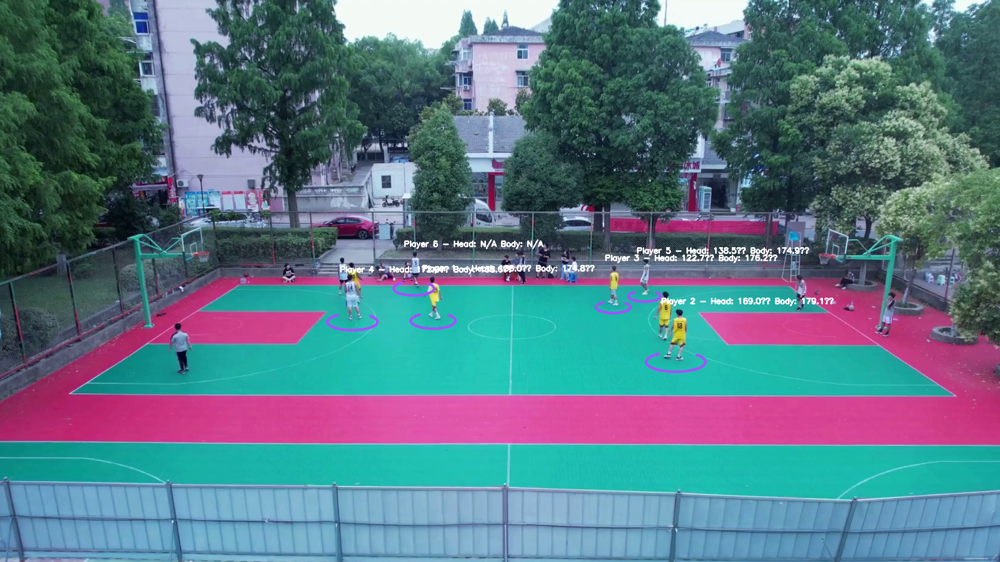


Posture Analysis Results:
Player 1 - Head dropping: 138.0°, Body slouching: 174.8°
Player 2 - Head dropping: 169.0°, Body slouching: 179.1°
Player 3 - Head dropping: 122.7°, Body slouching: 176.2°
Player 4 - Head dropping: 172.0°, Body slouching: 138.6°
Player 5 - Head dropping: 138.5°, Body slouching: 174.9°
Player 6 - Head dropping: N/A, Body slouching: N/A


In [ ]:
import cv2
import numpy as np
from ultralytics import YOLO
import supervision as sv

# Initialize models
pose_model = YOLO('yolov8n-pose.pt')
PLAYER_ID = 4
SOURCE_VIDEO_PATH = "/content/sample.mp4"

# Initialize annotators
ellipse_annotator = sv.EllipseAnnotator(thickness=3)
label_annotator = sv.LabelAnnotator(text_position=sv.Position.BOTTOM_CENTER)

def calculate_angle(a, b, c):
    """Calculate angle between three points (in degrees)"""
    a = np.array(a)
    b = np.array(b)
    c = np.array(c)

    radians = np.arctan2(c[1]-b[1], c[0]-b[0]) - np.arctan2(a[1]-b[1], a[0]-b[0])
    angle = np.abs(radians*180.0/np.pi)

    if angle > 180.0:
        angle = 360 - angle

    return angle

def get_single_frame(video_path):
    """Get first frame from video"""
    frame_generator = sv.get_video_frames_generator(video_path)
    return next(frame_generator)

def analyze_posture(frame):
    """Analyze head and body posture for all detected players"""
    # Player detection
    result = PLAYER_DETECTION_MODEL.infer(frame, confidence=0.3)[0]
    detections = sv.Detections.from_inference(result)

    # Filter players and apply NMS
    player_detections = detections[detections.class_id == PLAYER_ID]
    player_detections = player_detections.with_nms(threshold=0.3, class_agnostic=True)
    player_detections.class_id -= 1

    # Process each detected player
    player_results = []
    for i, xyxy in enumerate(player_detections.xyxy):
        x1, y1, x2, y2 = xyxy.astype(int)
        padding = int(0.2 * max(x2-x1, y2-y1))
        x1, y1 = max(0, x1-padding), max(0, y1-padding)
        x2, y2 = min(frame.shape[1], x2+padding), min(frame.shape[0], y2+padding)

        player_crop = frame[y1:y2, x1:x2]
        if player_crop.size == 0:
            continue

        # Pose estimation
        pose_results = pose_model(cv2.cvtColor(player_crop, cv2.COLOR_RGB2BGR), conf=0.5, verbose=False)[0]

        if pose_results.keypoints is not None:
            keypoints = pose_results.keypoints.xy[0].cpu().numpy()

            # Get relevant keypoints (using YOLOv8 keypoint indices)
            try:
                # YOLOv8 keypoint indices (may need adjustment)
                nose = keypoints[0] if len(keypoints) > 0 else None
                neck = (keypoints[5] + keypoints[6]) / 2 if len(keypoints) > 6 else None  # Average of shoulders
                left_shoulder = keypoints[5] if len(keypoints) > 5 else None
                right_shoulder = keypoints[6] if len(keypoints) > 6 else None
                left_hip = keypoints[11] if len(keypoints) > 11 else None
                right_hip = keypoints[12] if len(keypoints) > 12 else None

                # Calculate angles
                head_drop_angle = None
                body_slouch_angle = None

                if nose is not None and neck is not None and left_shoulder is not None:
                    # Head dropping: angle between nose, neck, and midpoint between shoulders
                    shoulder_mid = (left_shoulder + right_shoulder) / 2 if right_shoulder is not None else left_shoulder
                    head_drop_angle = calculate_angle(nose, neck, shoulder_mid)

                if left_shoulder is not None and right_shoulder is not None and left_hip is not None and right_hip is not None:
                    # Body slouching: angle between shoulders and hips
                    shoulder_mid = (left_shoulder + right_shoulder) / 2
                    hip_mid = (left_hip + right_hip) / 2
                    # Vertical reference point (above shoulders)
                    vertical_ref = np.array([shoulder_mid[0], shoulder_mid[1] - 100])  # 100 pixels above shoulder
                    body_slouch_angle = calculate_angle(vertical_ref, shoulder_mid, hip_mid)

                player_results.append({
                    'player_id': i+1,
                    'head_drop': head_drop_angle,
                    'body_slouch': body_slouch_angle,
                    'bbox': xyxy
                })

            except Exception as e:
                print(f"Error processing keypoints: {e}")
                continue

    return player_results

def visualize_results(frame, player_results):
    """Visualize posture analysis results on frame"""
    annotated_frame = frame.copy()

    # Draw player bounding boxes and labels
    detections = sv.Detections(
        xyxy=np.array([res['bbox'] for res in player_results]),
        class_id=np.array([0] * len(player_results))  # Dummy class IDs
    )

    annotated_frame = ellipse_annotator.annotate(scene=annotated_frame, detections=detections)

    # Add posture information
    for res in player_results:
        x1, y1, x2, y2 = res['bbox'].astype(int)
        label_y = y1 - 10 if y1 > 20 else y2 + 20

        # Format text
        hd_text = f"{res['head_drop']:.1f}°" if res['head_drop'] is not None else "N/A"
        bs_text = f"{res['body_slouch']:.1f}°" if res['body_slouch'] is not None else "N/A"
        text = f"Player {res['player_id']} - Head: {hd_text} Body: {bs_text}"

        cv2.putText(annotated_frame, text, (x1, label_y),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 255, 255), 2)

    return annotated_frame

# Process single frame
frame = get_single_frame(SOURCE_VIDEO_PATH)
player_results = analyze_posture(frame)
result_frame = visualize_results(frame, player_results)

# Display results
cv2_imshow(result_frame)

# Print results
print("\nPosture Analysis Results:")
for res in player_results:
    hd = f"{res['head_drop']:.1f}°" if res['head_drop'] is not None else "N/A"
    bs = f"{res['body_slouch']:.1f}°" if res['body_slouch'] is not None else "N/A"
    print(f"Player {res['player_id']} - Head dropping: {hd}, Body slouching: {bs}")

In [ ]:
from tqdm import tqdm

SOURCE_VIDEO_PATH = "/content/sample.mp4"
PLAYER_ID = 4
STRIDE = 30

frame_generator = sv.get_video_frames_generator(
    source_path=SOURCE_VIDEO_PATH, stride=STRIDE)

crops = []
for frame in tqdm(frame_generator, desc='collecting crops'):
    result = PLAYER_DETECTION_MODEL.infer(frame, confidence=0.3)[0]
    detections = sv.Detections.from_inference(result)
    detections = detections.with_nms(threshold=0.5, class_agnostic=True)
    detections = detections[detections.class_id == PLAYER_ID]
    players_crops = [sv.crop_image(frame, xyxy) for xyxy in detections.xyxy]
    crops += players_crops

collecting crops: 30it [09:44, 19.47s/it]


**Note:** Here's a sample (100 elements) of the crops we've gathered.

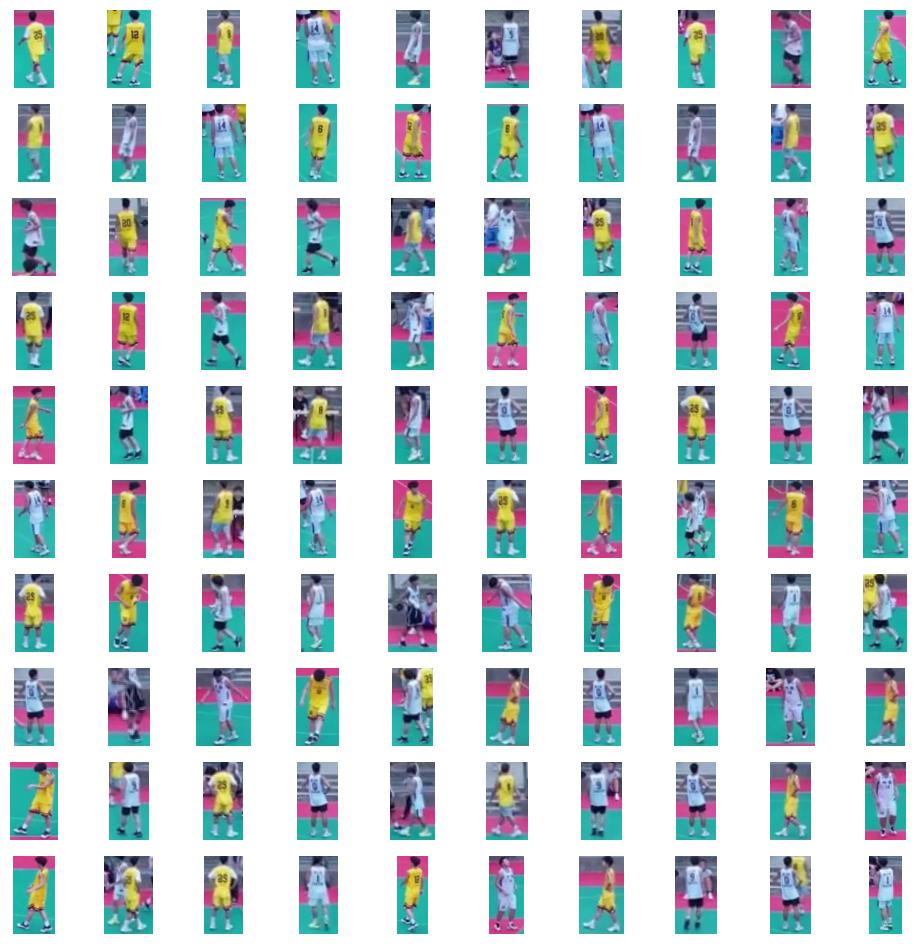

In [ ]:
sv.plot_images_grid(crops[:100], grid_size=(10, 10))

**Note:** Next, we'll run [SigLIP](https://huggingface.co/docs/transformers/en/model_doc/siglip) to calculate embeddings for each of the crops.

In [ ]:
import torch
from transformers import AutoProcessor, SiglipVisionModel

SIGLIP_MODEL_PATH = 'google/siglip-base-patch16-224'

DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'
EMBEDDINGS_MODEL = SiglipVisionModel.from_pretrained(SIGLIP_MODEL_PATH).to(DEVICE)
EMBEDDINGS_PROCESSOR = AutoProcessor.from_pretrained(SIGLIP_MODEL_PATH)

The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.


config.json:   0%|          | 0.00/432 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/813M [00:00<?, ?B/s]

preprocessor_config.json:   0%|          | 0.00/368 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/711 [00:00<?, ?B/s]

spiece.model:   0%|          | 0.00/798k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/409 [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/2.40M [00:00<?, ?B/s]

In [ ]:
import numpy as np
from more_itertools import chunked

BATCH_SIZE = 32

crops = [sv.cv2_to_pillow(crop) for crop in crops]
batches = chunked(crops, BATCH_SIZE)
data = []
with torch.no_grad():
    for batch in tqdm(batches, desc='embedding extraction'):
        inputs = EMBEDDINGS_PROCESSOR(images=batch, return_tensors="pt").to(DEVICE)
        outputs = EMBEDDINGS_MODEL(**inputs)
        embeddings = outputs.last_hidden_state[:, 0, :].cpu().numpy()
        data.append(embeddings)

data = np.concatenate(data)

embedding extraction: 8it [03:09, 23.65s/it]


**Note:** Using [UMAP](https://github.com/lmcinnes/umap), we project our embeddings from `(N, 768)` to `(N, 3)` and then perform a two-cluster division using [KMeans](https://scikit-learn.org/stable/modules/generated/sklearn.cluster.KMeans.html).

**Note:** Here's an interactive visualization of our results. Click on a dot to display its associated crop.

In [ ]:
import numpy as np
import torch
from tqdm import tqdm
from more_itertools import chunked
from transformers import AutoProcessor, SiglipVisionModel
import umap
from sklearn.decomposition import PCA
from sklearn.cluster import DBSCAN
from sklearn.preprocessing import StandardScaler
import cv2
import supervision as sv

# Load Pretrained Embedding Model
SIGLIP_MODEL_PATH = 'google/siglip-base-patch16-224'
DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'

EMBEDDINGS_MODEL = SiglipVisionModel.from_pretrained(SIGLIP_MODEL_PATH).to(DEVICE)
EMBEDDINGS_PROCESSOR = AutoProcessor.from_pretrained(SIGLIP_MODEL_PATH)

# Function to extract color histogram as additional feature
def extract_color_histogram(image, bins=(8, 8, 8)):
    hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
    hist = cv2.calcHist([hsv], [0, 1, 2], None, bins, [0, 180, 0, 256, 0, 256])
    cv2.normalize(hist, hist)
    return hist.flatten()

# Load Video & Extract Frames
SOURCE_VIDEO_PATH = "/content/sample.mp4"
PLAYER_ID = 4
STRIDE = 30

frame_generator = sv.get_video_frames_generator(
    source_path=SOURCE_VIDEO_PATH, stride=STRIDE)

crops = []
color_features = []

for frame in tqdm(frame_generator, desc='Collecting crops'):
    result = PLAYER_DETECTION_MODEL.infer(frame, confidence=0.3)[0]
    detections = sv.Detections.from_inference(result)
    detections = detections[detections.class_id == PLAYER_ID]

    players_crops = [sv.crop_image(frame, xyxy) for xyxy in detections.xyxy]
    crops += players_crops

    for player_crop in players_crops:
        color_features.append(extract_color_histogram(player_crop))

# Convert crops to PIL for model processing
crops_pil = [sv.cv2_to_pillow(crop) for crop in crops]

# Extract Deep Learning Embeddings
BATCH_SIZE = 32
batches = chunked(crops_pil, BATCH_SIZE)
embeddings_data = []

with torch.no_grad():
    for batch in tqdm(batches, desc='Extracting embeddings'):
        inputs = EMBEDDINGS_PROCESSOR(images=batch, return_tensors="pt").to(DEVICE)
        outputs = EMBEDDINGS_MODEL(**inputs)
        embeddings = torch.mean(outputs.last_hidden_state, dim=1).cpu().numpy()
        embeddings_data.append(embeddings)

embeddings_data = np.concatenate(embeddings_data)

# Combine Deep Learning Embeddings with Color Features
color_features = np.array(color_features)
features = np.hstack([embeddings_data, color_features])

# Apply PCA to Reduce Noise
pca = PCA(n_components=20)
features_pca = pca.fit_transform(features)

# Apply UMAP for Better Low-Dimensional Representation
REDUCER = umap.UMAP(n_components=5, min_dist=0.1, n_neighbors=15)
projections = REDUCER.fit_transform(features_pca)

# Normalize Features for Clustering
scaler = StandardScaler()
projections_scaled = scaler.fit_transform(projections)

# Apply DBSCAN Clustering (Density-Based)
CLUSTERING_MODEL = DBSCAN(eps=0.7, min_samples=5)
clusters = CLUSTERING_MODEL.fit_predict(projections_scaled)

# Visualize Results
import plotly.graph_objects as go

fig = go.Figure()

for cluster_id in np.unique(clusters):
    mask = clusters == cluster_id
    fig.add_trace(go.Scatter3d(
        x=projections_scaled[mask][:, 0],
        y=projections_scaled[mask][:, 1],
        z=projections_scaled[mask][:, 2],
        mode='markers',
        name=f'Cluster {cluster_id}'
    ))

fig.update_layout(title="DBSCAN Player Clustering", width=1000, height=800)
fig.show()


Extracting embeddings: 8it [02:53, 21.70s/it]


Available teams (clusters): [0, 1]
Enter the Cluster ID of the team you want to view: 0


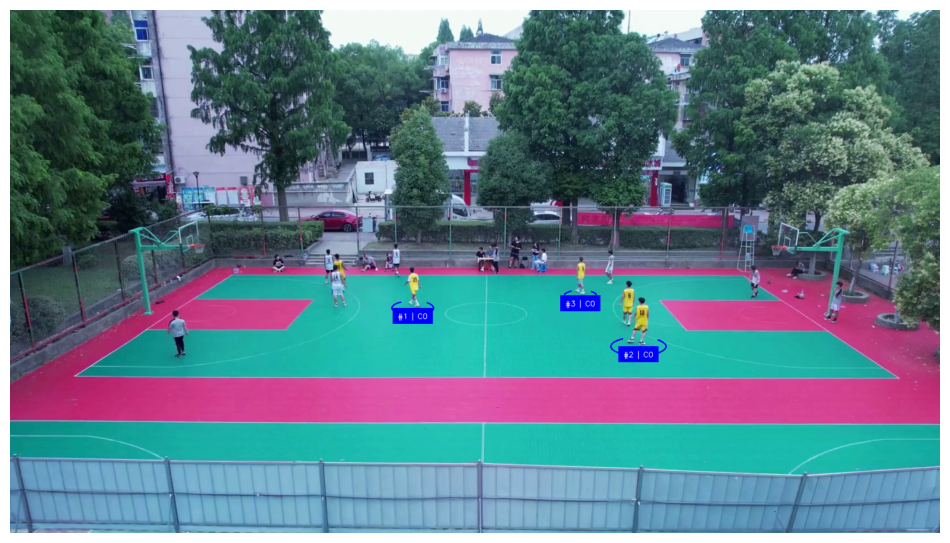

In [ ]:
import supervision as sv
import numpy as np

SOURCE_VIDEO_PATH = "/content/sample.mp4"
PLAYER_ID = 4

# Color Palette for Clusters (Auto-Generate Unique Colors)
unique_clusters = np.unique(clusters)
colors = sv.ColorPalette.from_hex(['#0000FF', '#FF0000', '#00FF00', '#FF00FF', '#FFA500'])

ellipse_annotator = sv.EllipseAnnotator(
    color=colors,
    thickness=2
)
label_annotator = sv.LabelAnnotator(
    color=colors,
    text_color=sv.Color.from_hex('#FFFFFF'),
    text_position=sv.Position.BOTTOM_CENTER
)

# Initialize Tracker
tracker = sv.ByteTrack()
tracker.reset()

# Get video frames
frame_generator = sv.get_video_frames_generator(SOURCE_VIDEO_PATH)
frame = next(frame_generator)

# Perform Player Detection
result = PLAYER_DETECTION_MODEL.infer(frame, confidence=0.3)[0]
detections = sv.Detections.from_inference(result)

# Filter Player Detections
players_detections = detections[detections.class_id == PLAYER_ID]
players_detections = players_detections.with_nms(threshold=0.5, class_agnostic=True)
players_detections = tracker.update_with_detections(detections=players_detections)

# Crop Player Regions for Clustering
players_crops = [sv.crop_image(frame, xyxy) for xyxy in players_detections.xyxy]

# Predict Cluster Labels
cluster_assignments = clusters[:len(players_crops)]  # Assign clusters to current players

# Assign Cluster IDs to Players
players_detections.class_id = cluster_assignments

# Get unique cluster IDs for user selection
available_clusters = np.unique(players_detections.class_id)

# Ask User for Team Selection
print(f"Available teams (clusters): {list(available_clusters)}")
selected_team = int(input("Enter the Cluster ID of the team you want to view: "))

# Filter Players by Selected Team
filtered_detections = players_detections[players_detections.class_id == selected_team]

# Create Labels for Selected Players
labels = [
    f"#{tracker_id} | C{cluster_id}"
    for tracker_id, cluster_id
    in zip(filtered_detections.tracker_id, filtered_detections.class_id)
]

# Convert Class IDs to Integers for Coloring
filtered_detections.class_id = filtered_detections.class_id.astype(int)

# Annotate Frame with Only Selected Team
annotated_frame = frame.copy()
annotated_frame = ellipse_annotator.annotate(
    scene=annotated_frame,
    detections=filtered_detections)
annotated_frame = label_annotator.annotate(
    scene=annotated_frame,
    detections=filtered_detections,
    labels=labels)

# Display the Annotated Frame
sv.plot_image(annotated_frame)


## pitch keypoint detection

In [ ]:
from inference import get_model
from google.colab import userdata

ROBOFLOW_API_KEY = userdata.get('ROBOFLOW_API')
COURT_DETECTION_MODEL_ID = "working-court/1"
COURT_DETECTION_MODEL = get_model(model_id=COURT_DETECTION_MODEL_ID, api_key=ROBOFLOW_API_KEY)

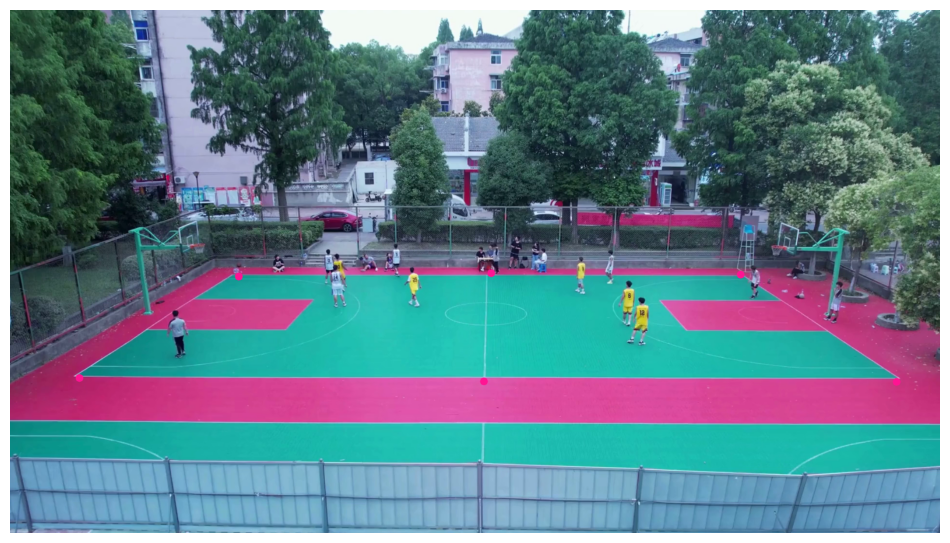

In [ ]:
import supervision as sv

SOURCE_VIDEO_PATH = "/content/sample.mp4"

vertex_annotator = sv.VertexAnnotator(
    color=sv.Color.from_hex('#FF1493'),
    radius=8)

frame_generator = sv.get_video_frames_generator(SOURCE_VIDEO_PATH)
frame = next(frame_generator)

result = COURT_DETECTION_MODEL.infer(frame, confidence=0.3)[0]
key_points = sv.KeyPoints.from_inference(result)

annotated_frame = frame.copy()
annotated_frame = vertex_annotator.annotate(
    scene=annotated_frame,
    key_points=key_points)

sv.plot_image(annotated_frame)

**Note:** Notice that some of the keypoints we detected are in incorrect locations. These are keypoints with a low confidence level. Let's filter out these keypoints and keep only the ones the model is confident about.

## filter low confidence keypoints

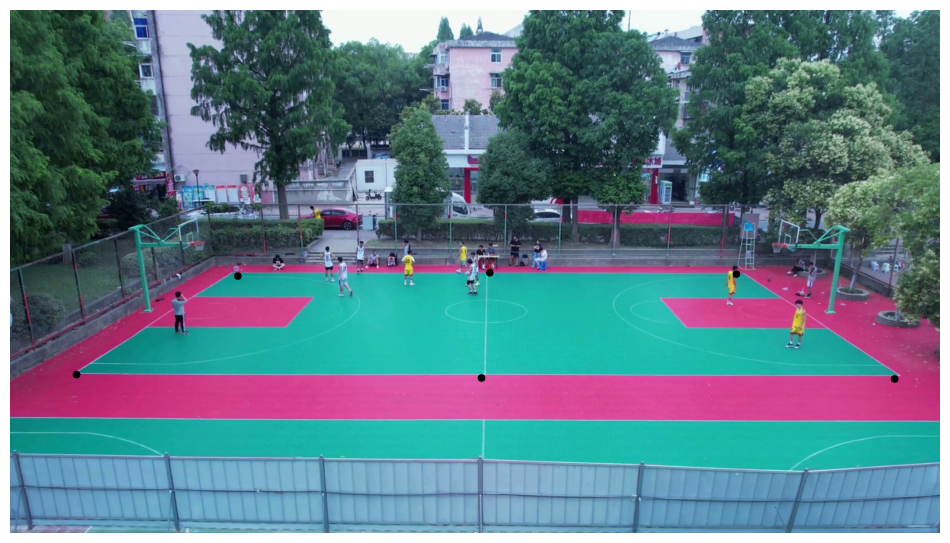

In [ ]:
import supervision as sv

SOURCE_VIDEO_PATH = "/content/sample.mp4"

vertex_annotator = sv.VertexAnnotator(
    color=sv.Color.from_hex('#000000'),
    radius=8)

frame_generator = sv.get_video_frames_generator(SOURCE_VIDEO_PATH, start=200)
frame = next(frame_generator)

result = COURT_DETECTION_MODEL.infer(frame, confidence=0.3)[0]
key_points = sv.KeyPoints.from_inference(result)

filter = key_points.confidence[0] > 0.5
frame_reference_points = key_points.xy[0][filter]
frame_reference_key_points = sv.KeyPoints(
    xy=frame_reference_points[np.newaxis, ...])

annotated_frame = frame.copy()
annotated_frame = vertex_annotator.annotate(
    scene=annotated_frame,
    key_points=frame_reference_key_points)

sv.plot_image(annotated_frame)

## project pitch lines on frame

**Note:** The [sports](https://github.com/roboflow/sports) repository contains a [`SoccerPitchConfiguration`](https://github.com/roboflow/sports/blob/06053616f1f8a8ae1fa936eb00dcdc2e4f888bb1/sports/configs/soccer.py#L6) that provides information about the real-world geometry of the soccer pitch. It also includes utilities for visualizing elements located on the pitch.

In [ ]:
from dataclasses import dataclass, field
from typing import List, Tuple

@dataclass
class BasketballCourtConfiguration:
    width: int = 1500  # [cm]
    length: int = 2800  # [cm]

    @property
    def vertices(self) -> List[Tuple[int, int]]:
        return [
            (0, self.width),          # 0 - top-left
            (self.length//2, self.width),  # 1 - top-mid
            (self.length, self.width),  # 2 - top-right
            (self.length, 0),          # 3 - bottom-right
            (self.length//2, 0),       # 4 - bottom-mid
            (0, 0)                     # 5 - bottom-left
        ]

    edges: List[Tuple[int, int]] = field(default_factory=lambda: [
        (0, 1), (1, 2), (2, 3), (3, 4), (4, 5), (5, 0),  # Court boundaries
        (1, 4)  # Midcourt line (top-mid to bottom-mid)
    ])

    labels: List[str] = field(default_factory=lambda: [
        "top-left", "upper-mid", "top-right",
        "bottom-right", "bottom-mid", "bottom-left"
    ])

    colors: List[str] = field(default_factory=lambda: [
        "#FF0000", "#FF0000", "#FF0000", "#FF0000", "#00FF00", "#00FF00"
    ])

CONFIG = BasketballCourtConfiguration()

In [ ]:
from typing import Optional, List

import cv2
import supervision as sv
import numpy as np

class CourtEdgeAnnotator:
    def __init__(self):
        self.color = sv.Color.from_hex('#00BFFF')
        self.thickness = 2

    def annotate(self, scene: np.ndarray, key_points: np.ndarray) -> np.ndarray:
        # Draw all court boundaries
        for i in range(6):
            start = key_points.xy[0][i]
            end = key_points.xy[0][(i+1)%6]
            cv2.line(scene,
                    tuple(start.astype(int)),
                    tuple(end.astype(int)),
                    self.color.as_bgr(),
                    self.thickness)

        # Explicitly draw midcourt line
        cv2.line(scene,
                tuple(key_points.xy[0][1].astype(int)),  # top-mid
                tuple(key_points.xy[0][4].astype(int)),  # bottom-mid
                self.color.as_bgr(),
                self.thickness)
        return scene

Transformed points:
Point 0: [      472.7      545.62]
Point 1: [     984.66      546.32]
Point 2: [     1501.6      547.03]
Point 3: [     1825.4       761.2]
Point 4: [     974.16      758.33]
Point 5: [      136.4       755.5]
Midcourt connects: [     984.66      546.32] to [     974.16      758.33]


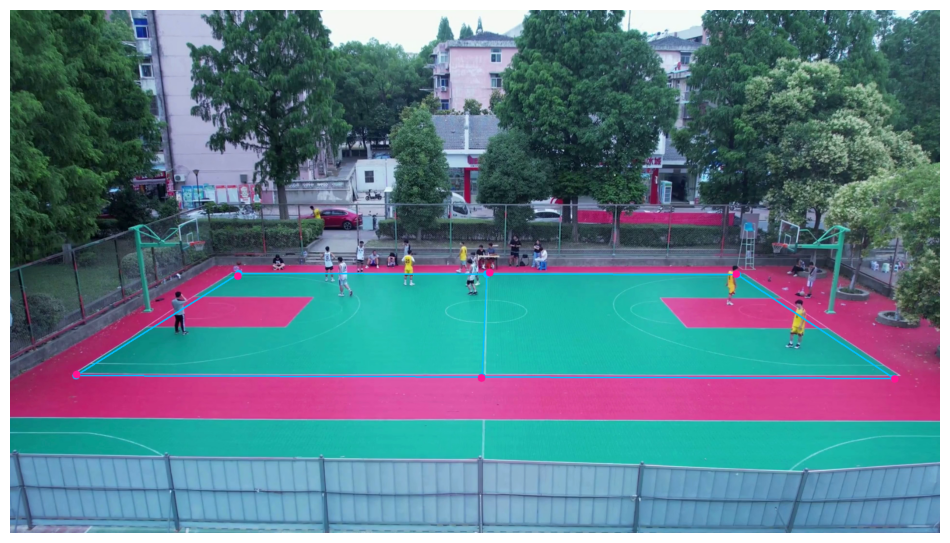

In [ ]:
SOURCE_VIDEO_PATH = "/content/sample.mp4"

# Initialize annotators
edge_annotator = CourtEdgeAnnotator()
vertex_annotator = sv.VertexAnnotator(color=sv.Color.from_hex('#FF1493'), radius=8)
vertex_annotator_2 = sv.VertexAnnotator(color=sv.Color.from_hex('#00BFFF'), radius=8)

# Process frame
frame_generator = sv.get_video_frames_generator(SOURCE_VIDEO_PATH, start=200)
frame = next(frame_generator)

# Detect court keypoints
result = COURT_DETECTION_MODEL.infer(frame, confidence=0.3)[0]
key_points = sv.KeyPoints.from_inference(result)

# Filter keypoints
confidence_threshold = 0.5
filter_mask = key_points.confidence[0] > confidence_threshold
frame_reference_points = key_points.xy[0][filter_mask]
pitch_reference_points = np.array(CONFIG.vertices)[filter_mask]

# Create transformer
transformer = ViewTransformer(
    source=pitch_reference_points,
    target=frame_reference_points
)

# Transform all points
frame_all_points = transformer.transform_points(points=np.array(CONFIG.vertices))
frame_all_key_points = sv.KeyPoints(xy=frame_all_points[np.newaxis, ...])

# Debug output
print("Transformed points:")
for i, pt in enumerate(frame_all_points):
    print(f"Point {i}: {pt}")
print(f"Midcourt connects: {frame_all_points[1]} to {frame_all_points[4]}")

# Annotate frame
annotated_frame = frame.copy()
annotated_frame = edge_annotator.annotate(annotated_frame, frame_all_key_points)
annotated_frame = vertex_annotator_2.annotate(annotated_frame, key_points=frame_all_key_points)
annotated_frame = vertex_annotator.annotate(
    scene=annotated_frame,
    key_points=sv.KeyPoints(xy=frame_reference_points[np.newaxis, ...])
)

# Display
sv.plot_image(annotated_frame)

**Note:** It's time to utilize the keypoint pairs located on the camera perspective plane and the football pitch plane. The [sports](https://github.com/roboflow/sports) repository includes a [`ViewTransformer`](https://github.com/roboflow/sports/blob/06053616f1f8a8ae1fa936eb00dcdc2e4f888bb1/sports/common/view.py#L7), which employs homography for perspective transformation.

In [ ]:
from collections import defaultdict, deque
from ultralytics import YOLO
from tqdm import tqdm
import supervision as sv
import numpy as np
import cv2
from google.colab.patches import cv2_imshow
from IPython.display import clear_output
from inference import get_model
from google.colab import userdata
from sports.common.view import ViewTransformer

# ======================
# 1. INITIAL SETUP
# ======================
# Model and video settings
MODEL_NAME = 'yolov8n-pose.pt'
SOURCE_VIDEO_PATH = "/content/sample.mp4"
TARGET_VIDEO_PATH = "/content/output.mp4"
PLAYER_ID = 4  # COCO class ID for person
STRIDE = 30
MAX_PLAYERS = 10
TRACKING_BUFFER = 30
CONFIDENCE_THRESHOLD = 0.3
IOU_THRESHOLD = 0.3

# Initialize court detection model
ROBOFLOW_API_KEY = userdata.get('ROBOFLOW_API')
COURT_DETECTION_MODEL_ID = "working-court/1"
COURT_DETECTION_MODEL = get_model(model_id=COURT_DETECTION_MODEL_ID, api_key=ROBOFLOW_API_KEY)

# ======================
# 2. HELPER FUNCTIONS
# ======================
def calculate_speed(distance_pixels, frame_rate, pixels_per_meter=100):
    """Convert pixel distance to km/h speed"""
    distance_meters = distance_pixels / pixels_per_meter
    speed_mps = distance_meters * frame_rate
    return speed_mps * 3.6

def get_player_foot_position(detection, pose_results):
    """Get player's ground contact point"""
    if pose_results.keypoints is not None:
        keypoints = pose_results.keypoints.xy[0].cpu().numpy()
        if len(keypoints) >= 13:  # COCO keypoints
            ankles = [kp for i, kp in enumerate(keypoints) if i in [11,12] and kp[0] > 0]
            if ankles:
                return np.mean(ankles, axis=0)

    # Fallback to bounding box bottom center
    x1, y1, x2, y2 = detection.xyxy[0]
    return np.array([(x1 + x2) / 2, y2])

def initialize_view_transformer(video_path):
    """Initialize the view transformer with court detection"""
    # Get sample frame
    frame_generator = sv.get_video_frames_generator(video_path)
    sample_frame = next(frame_generator)

    # Detect court
    court_result = COURT_DETECTION_MODEL.infer(sample_frame, confidence=0.3)[0]
    court_keypoints = sv.KeyPoints.from_inference(court_result)

    # Filter points
    confidence_threshold = 0.5
    filter_mask = court_keypoints.confidence[0] > confidence_threshold
    frame_points = court_keypoints.xy[0][filter_mask]

    # Court reference points (in cm) - must match detection order
    court_points = np.array([
        [0, 1500],    # top-left
        [1400, 1500], # top-mid
        [2800, 1500], # top-right
        [2800, 0],    # bottom-right
        [1400, 0],    # bottom-mid
        [0, 0]        # bottom-left
    ])[filter_mask]

    print("Court reference points:", court_points)
    print("Detected frame points:", frame_points)

    return ViewTransformer(source=court_points, target=frame_points)

# ======================
# 3. PLAYER TRACKER CLASS
# ======================
class PlayerTracker:
    def __init__(self, max_players=10, tracking_buffer=30):
        self.max_players = max_players
        self.tracking_buffer = tracking_buffer
        self.available_ids = list(range(1, max_players + 1))
        self.active_players = {}
        self.tracker = sv.ByteTrack()

    def update(self, detections):
        tracked_detections = self.tracker.update_with_detections(detections=detections)
        current_ids = set(tracked_detections.tracker_id)

        # Handle lost players
        for lost_id in set(self.active_players.keys()) - current_ids:
            if self.active_players[lost_id][1] <= 0:
                self.available_ids.append(self.active_players[lost_id][0])
                del self.active_players[lost_id]
            else:
                self.active_players[lost_id] = (self.active_players[lost_id][0],
                                               self.active_players[lost_id][1] - 1)

        # Assign IDs to new players
        for new_id in current_ids - set(self.active_players.keys()):
            assigned_id = self.available_ids.pop(0) if self.available_ids else 0
            self.active_players[new_id] = (assigned_id, self.tracking_buffer)

        # Update active players
        id_mapping = {}
        for tracker_id in tracked_detections.tracker_id:
            if tracker_id in self.active_players:
                id_mapping[tracker_id] = self.active_players[tracker_id][0]
                self.active_players[tracker_id] = (id_mapping[tracker_id], self.tracking_buffer)

        return tracked_detections, id_mapping

# ======================
# 4. MAIN PROCESSING
# ======================
def process_video_with_speed(video_path):
    # Initialize models
    pose_model = YOLO(MODEL_NAME)
    player_tracker = PlayerTracker(MAX_PLAYERS, TRACKING_BUFFER)

    # Video setup
    video_info = sv.VideoInfo.from_video_path(video_path)
    frame_generator = sv.get_video_frames_generator(video_path, stride=STRIDE)

    # Initialize view transformer
    view_transformer = initialize_view_transformer(video_path)

    # Annotators
    ellipse_annotator = sv.EllipseAnnotator(thickness=3)
    label_annotator = sv.LabelAnnotator(text_position=sv.Position.BOTTOM_CENTER)

    # Tracking storage
    player_positions = defaultdict(lambda: deque(maxlen=int(video_info.fps * 2)))
    speed_history = defaultdict(lambda: deque(maxlen=5))  # 5-frame moving average

    with sv.VideoSink(TARGET_VIDEO_PATH, video_info) as sink:
        for frame in tqdm(frame_generator, total=video_info.total_frames//STRIDE):
            # Player detection
            results = pose_model(frame, verbose=False)[0]
            detections = sv.Detections.from_ultralytics(results)
            detections = detections[detections.class_id == PLAYER_ID]
            detections = detections.with_nms(IOU_THRESHOLD)

            # Tracking
            tracked_dets, id_map = player_tracker.update(detections)

            # Process each player
            labels = []
            for detection, tracker_id in zip(tracked_dets, tracked_dets.tracker_id):
                # Get foot position and transform to court coordinates
                foot_pos = get_player_foot_position(detection, results)
                court_pos = view_transformer.transform_points(np.array([foot_pos]))[0]

                # Update position history and calculate speed
                player_positions[tracker_id].append(court_pos)
                if len(player_positions[tracker_id]) > 1:
                    distance = np.linalg.norm(player_positions[tracker_id][-1] -
                                player_positions[tracker_id][-2])
                    speed = calculate_speed(distance, video_info.fps)
                    speed_history[tracker_id].append(speed)

                # Create label with averaged speed
                avg_speed = np.mean(speed_history[tracker_id]) if speed_history[tracker_id] else 0
                labels.append(f"#{id_map[tracker_id]} {int(avg_speed)}km/h")

            # Annotate and write frame
            annotated_frame = frame.copy()
            annotated_frame = ellipse_annotator.annotate(annotated_frame, tracked_dets)
            annotated_frame = label_annotator.annotate(annotated_frame, tracked_dets, labels)
            sink.write_frame(annotated_frame)

# ======================
# 5. EXECUTION
# ======================
process_video_with_speed(SOURCE_VIDEO_PATH)

Court reference points: [[   0 1500]
 [1400 1500]
 [2800 1500]
 [2800    0]
 [1400    0]
 [   0    0]]
Detected frame points: [[        472         551]
 [        993         544]
 [       1508         547]
 [       1830         768]
 [        978         767]
 [        143         760]]


100%|██████████| 30/30 [00:21<00:00,  1.41it/s]


Court reference points: [[   0 1500]
 [1400 1500]
 [2800 1500]
 [2800    0]
 [1400    0]
 [   0    0]]
Detected frame points: [[        472         551]
 [        993         544]
 [       1508         547]
 [       1830         768]
 [        978         767]
 [        143         760]]


/usr/local/lib/python3.11/dist-packages/supervision/utils/internal.py:117: SupervisionWarnings:

BoundingBoxAnnotator is deprecated: `BoundingBoxAnnotator` is deprecated and has been renamed to `BoxAnnotator`. `BoundingBoxAnnotator` will be removed in supervision-0.26.0.



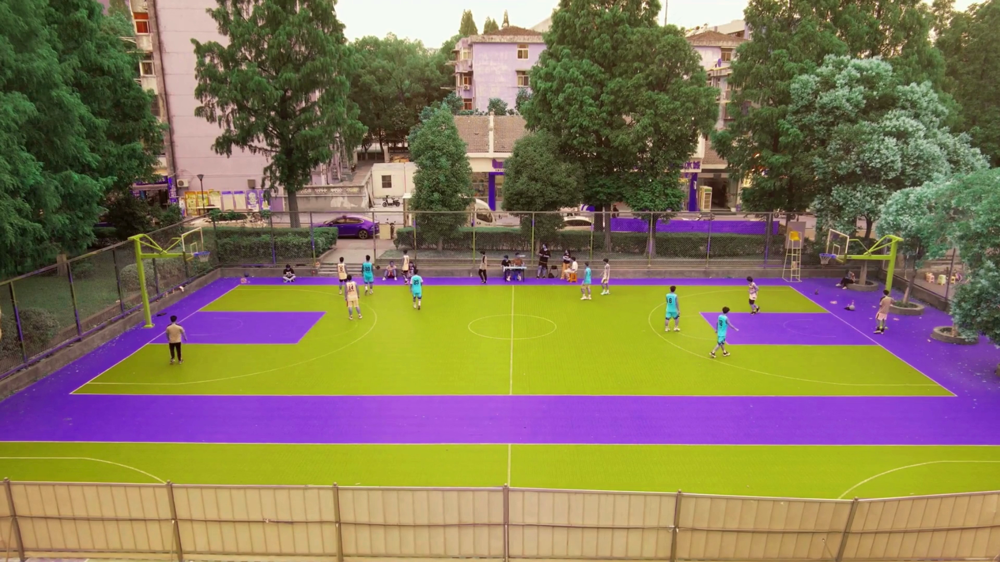

In [ ]:
def process_single_frame_with_speed(frame, pose_model, player_tracker, view_transformer, video_info):
    # Initialize annotators
    ellipse_annotator = sv.EllipseAnnotator(thickness=3)
    label_annotator = sv.LabelAnnotator(
        text_position=sv.Position.TOP_LEFT,
        text_scale=0.8,
        text_thickness=2,
        text_padding=10
    )

    # Tracking storage (maintained between frames)
    if not hasattr(process_single_frame_with_speed, 'player_positions'):
        process_single_frame_with_speed.player_positions = defaultdict(lambda: deque(maxlen=int(video_info.fps * 2)))
        process_single_frame_with_speed.speed_history = defaultdict(lambda: deque(maxlen=5))

    # Player detection
    results = pose_model(frame, verbose=False)[0]
    detections = sv.Detections.from_ultralytics(results)
    detections = detections[detections.class_id == PLAYER_ID]
    detections = detections.with_nms(IOU_THRESHOLD)

    # Tracking
    tracked_dets, id_map = player_tracker.update(detections)

    # Process each player
    labels = []
    for detection, tracker_id in zip(tracked_dets, tracked_dets.tracker_id):
        # Get foot position and transform to court coordinates
        foot_pos = get_player_foot_position(detection, results)
        court_pos = view_transformer.transform_points(np.array([foot_pos]))[0]

        # Update position history and calculate speed
        process_single_frame_with_speed.player_positions[tracker_id].append(court_pos)
        if len(process_single_frame_with_speed.player_positions[tracker_id]) > 1:
            distance = np.linalg.norm(
                process_single_frame_with_speed.player_positions[tracker_id][-1] -
                process_single_frame_with_speed.player_positions[tracker_id][-2]
            )
            speed = calculate_speed(distance, video_info.fps)
            process_single_frame_with_speed.speed_history[tracker_id].append(speed)

        # Create label with averaged speed
        avg_speed = np.mean(process_single_frame_with_speed.speed_history[tracker_id]) if process_single_frame_with_speed.speed_history[tracker_id] else 0
        labels.append(f"Player {id_map[tracker_id]}: {avg_speed:.1f} km/h")

    # Annotate frame
    annotated_frame = frame.copy()
    annotated_frame = ellipse_annotator.annotate(annotated_frame, tracked_dets)
    annotated_frame = label_annotator.annotate(annotated_frame, tracked_dets, labels)

    # Display speed summary in corner
    speed_text = "\n".join(labels)
    y_offset = 30
    for line in speed_text.split('\n'):
        cv2.putText(annotated_frame, line, (10, y_offset),
                   cv2.FONT_HERSHEY_SIMPLEX, 0.7, (0, 255, 255), 2)
        y_offset += 30

    return annotated_frame

# Usage example:
frame_generator = sv.get_video_frames_generator(SOURCE_VIDEO_PATH)
pose_model = YOLO(MODEL_NAME)
player_tracker = PlayerTracker(MAX_PLAYERS, TRACKING_BUFFER)
video_info = sv.VideoInfo.from_video_path(SOURCE_VIDEO_PATH)
view_transformer = initialize_view_transformer(SOURCE_VIDEO_PATH)

# Process and display single frame
frame = next(frame_generator)
result_frame = process_single_frame_with_speed(
    frame, pose_model, player_tracker, view_transformer, video_info
)

# Display the result
cv2_imshow(result_frame)
clear_output(wait=True)